
# Preprocessing - Concatenate Multiome Samples
Michael Sterr

2023-11-30 23:32:32    


# Setup


In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))

/tmp/ipykernel_2149476/495279268.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
# General
import scipy as sci
import numpy as np
import pandas as pd
import logging
import time
import pickle
from itertools import chain
import h5py
import scipy.sparse as sparse
import anndata as ad

#R
import rpy2
import rpy2.robjects as ro
import rpy2.rinterface_lib.callbacks
from rpy2.robjects import pandas2ri
import anndata2ri

# Plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import rcParams
from matplotlib import cm
import seaborn as sb

# Analysis
import muon as mu
import scanpy as sc
import scvelo as scv

In [3]:
# Settings

## Scanpy settings
sc.settings.verbosity = 3
sc.logging.print_versions()

## ScVelo settings
scv.settings.verbosity = 3
scv.logging.print_versions()

## R settings
### Ignore R warning messages
#### Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

### Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                         9.4.0
anndata2ri                  1.1
asttokens                   NA
backcall                    0.2.0
backports                   NA
cffi                        1.15.1
comm                        0.1.2
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.6.6
decorator                   5.1.1
defusedxml                  0.7.1
executing                   1.2.0
h5py                        3.8.0
igraph                      0.10.8
importlib_resources         NA
ipykernel                   6.21.2
ipython_genutils            0.2.0
ipywidgets                  7.7.1
jedi                        0.18.2
jinja2                      3.0.3
joblib                      1.2.0
kiwisolver                  1.4.4
leidenalg                   0.10.1
llvmlite                    0.39.1
louvain                     0.8.1
markupsafe                  2.1.2
matplot

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


In [4]:
# Color maps
exec(open("/home/michi/Software/viscm/maps/michi_bk_bl_gn_yl.py").read())

In [5]:
# Plot settings
%matplotlib inline

## Directory
sc.settings.figdir='/home/michi/Projects/scMultiome_Mouse-Islets_NVF_E14-E16_Notebooks//Figures'

## Plotting parameters
rcParams['figure.figsize']=(20,20) #rescale figures
#sc.set_figure_params(scanpy=True, frameon=False, vector_friendly=False, color_map='tab10' ,transparent=True, dpi=150, dpi_save=300)
sc.set_figure_params(scanpy=True, frameon=False, vector_friendly=False ,transparent=True, dpi=150, dpi_save=300)

## Font
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Source Sans 3']

## Grid & Ticks
rcParams['grid.alpha'] = 0
rcParams['xtick.bottom'] = True
rcParams['ytick.left'] = True

## Embed font
plt.rc('pdf', fonttype=42)

## Define new default settings
plt.rcParamsDefault = plt.rcParams

# Functions

In [6]:
def get_umap_leiden(adata, resolution=0.5, exclude_highly_expressed=False):
       
    # preprocess adata, cluster and get umap
    adata_pp = adata.copy()
    sc.pp.normalize_total(adata_pp, target_sum=1e4, exclude_highly_expressed=exclude_highly_expressed, key_added='size_factor') #sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
    sc.pp.log1p(adata_pp)
    sc.pp.pca(adata_pp)
    sc.pp.neighbors(adata_pp, metric='correlation')
    sc.tl.leiden(adata_pp, resolution=resolution)
    sc.tl.umap(adata_pp)
    
    adata.obsm['X_umap'] = adata_pp.obsm['X_umap'].copy()
    adata.obs['leiden'] = adata_pp.obs['leiden'].copy()
    
            
###################################################################################################################
###################################################################################################################
###################################################################################################################
    

def qc_metrics(adata, ambient=True, plot=True, counts_per_gene=True, keep_dense=True, genome='auto', mt_genes_path='/mnt/ssd/Resources/sus_scrofa_mt_ens101_ext.txt'):
    """\
    Calculate QC metrics.
    genome: {'auto','Mus_musculus','Homo_sapiens','Sus_scrofa'}
    mt_genes_path: Path to mitochondrial genes for sus scrofa. Tab delimited file without header and with gene symbols in column 2. default: '/mnt/ssd/Resources/sus_scrofa_mt_ens101_ext.txt'
    ambient: Requires adata.var['is_ambient'] = pd.Categorical(list(map(str,list(adata.var['ambient_genes'] > cut_off))))
    """
    
    is_ambi_key = 'is_ambient'
    
    if genome=='auto':
        genome = '_'.join(adata.var.loc[:,'genome'][0].split('_')[0:2])
        print('Genome is', genome)

    if sci.sparse.issparse(adata.X):
        adata.X = adata.X.toarray()

    if counts_per_gene:
        # counts per gene
        adata.var['n_counts'] = adata.X.sum(0)

    # counts per cell
    adata.obs['n_counts'] = adata.X.sum(1)
    # log counts per cell
    adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
    # rank by counts
    adata.obs['n_counts_rank'] = adata.obs['n_counts'].rank(method='first',ascending=False)
    # genes per cell
    adata.obs['n_genes'] = (adata.X > 0).sum(1)
    # log genes per cell
    adata.obs['log_genes'] = np.log(adata.obs['n_genes'])
    # fraction of mitochondrial genes
    if (genome == 'Homo_sapiens') | (genome == 'homo_sapiens'):
        mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
        adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

        rp_gene_mask = [gene.startswith(('RPS','RPL')) for gene in adata.var_names]
        adata.obs['rp_frac'] = adata.X[:,rp_gene_mask].sum(1) / adata.obs['n_counts']

    elif (genome == 'Mus_musculus') | (genome == 'mus_musculus'):
        mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
        adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

        rp_gene_mask = [gene.startswith(('Rps','Rpl')) for gene in adata.var_names]
        adata.obs['rp_frac'] = adata.X[:,rp_gene_mask].sum(1) / adata.obs['n_counts']

    elif (genome == 'Sus_scrofa') | (genome == 'sus_scrofa'):
        mt_genes = [gene.split('-')[0] for gene in list(pd.read_csv(mt_genes_path , header=None, sep="\t")[1])]
        mt_gene_mask = adata.var_names.isin(mt_genes)
        adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

        rp_gene_mask = [gene.startswith(('RPS','RPL')) for gene in adata.var_names]
        adata.obs['rp_frac'] = adata.X[:,rp_gene_mask].sum(1) / adata.obs['n_counts']

    if ambient:
        adata.obs['ambi_frac'] = adata.X[:,adata.var[is_ambi_key]==True].sum(1) / adata.obs['n_counts']

    if plot:
        sb.jointplot(
            data=adata.obs,
            x="log_counts",
            y="log_genes",
            kind="hist", bins=100, cmap="rocket_r", color="#f69c73", space=0
        )

        fig, ax1 = plt.subplots()
        ax1.scatter(x=adata.obs['n_counts_rank'], y=adata.obs['n_counts'], s=1, alpha=0.2, c='black', label='Total UMI Counts')
        ax1.scatter(x=adata.obs['n_counts_rank'], y=adata.obs['n_genes'], s=1, alpha=0.2, c='tab:green', label='Gene Counts')
        ax1.set(xscale='log', yscale='log')
        ax1.set_ylabel('Total UMI/Gene Counts')
        ax1.set_xlabel('Ranked Droplets')
        #ax1.vlines(x=[max_rank], color="black", lw=0.5).set_linestyle("--")

        ax2 = ax1.twinx()
        ax2.scatter(x=adata.obs['n_counts_rank'], y=adata.obs['mt_frac']*100, s=1, alpha=0.2, c='tab:red', label='% Mito. Counts')
        ax2.set_ylabel('%')

        fig.legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(0.2, 0.35))
        
    if not keep_dense:
        adata.X = sci.sparse.csr_matrix(adata.X)  
        


###################################################################################################################
###################################################################################################################
###################################################################################################################
    
    
def atac_qc_metrics(atac, mdata, n_tss=2000, plot=True):
    """\
    Calculate QC metrics.
    atac: adata object containing atac data. i.e. mdata.mod['atac']
    mdata: Corresponding mdata object
    tss: {'random','top'} random tss or the n tss with highest rna counts
    n_top: number of tss
    """
    import muon as mu
    from muon import atac as ac
    
    if sci.sparse.issparse(atac.X):
        print('X is spare. Densifying X...')
        atac.X = atac.X.toarray()
    
    # counts per peak
    atac.var['n_counts'] = atac.X.sum(0)
    # counts per cell
    atac.obs['n_counts_ATAC'] = list(atac.X.sum(1))
    # log counts per cell
    atac.obs['log_counts_ATAC'] = np.log(atac.obs['n_counts_ATAC'] + 1)
    # rank by counts
    atac.obs['n_counts_rank_ATAC'] = atac.obs['n_counts_ATAC'].rank(method='first',ascending=False)
    # genes per cell
    atac.obs['n_peaks_ATAC'] = (atac.X > 0).sum(1)
    # log genes per cell
    atac.obs['log_peaks_ATAC'] = np.log(atac.obs['n_peaks_ATAC'] + 1)
    
    if plot:
        mu.pl.histogram(atac, ['n_counts_ATAC', 'n_peaks_ATAC'])
        
    # nucleosome signal
    ac.tl.nucleosome_signal(atac, n=1e6)
    
    if plot:
        # plot nucleosome signal
        ac.pl.fragment_histogram(atac, region='1:1-20000000')
        mu.pl.histogram(atac, "nucleosome_signal", kde=True)
        
    # TSS enrichment
    tss = ac.tl.tss_enrichment(mdata, n_tss=n_tss)  # by default, features=ac.tl.get_gene_annotation_from_rna(mdata)
    if plot:
        # plot TSS enrichment
        ac.pl.tss_enrichment(tss)
    
        

###################################################################################################################
###################################################################################################################
###################################################################################################################
    
        
def get_feature_pos_from_gtf(gtf_path=None, random=True):
    # load Ensembl annotation file and reduce to genes
    annotation = pd.read_csv(gtf_path, header=None, skiprows=5, sep='\t')
    annotation = annotation.loc[annotation.iloc[:,2]=='gene',:]

    # get positions of + features
    features_p = annotation.loc[annotation.iloc[:,6]=='+',:].iloc[:,[0,3,4]]     
    features_p.columns = ['Chromosome','Start','End']

    # get positions of - features and switch start and end
    features_m = annotation.loc[annotation.iloc[:,6]=='-',:].iloc[:,[0,4,3]]     
    features_m.columns = ['Chromosome','Start','End']

    # concatenate
    features = pd.concat([features_p, features_m], ignore_index = True)
    
    # randomize order
    if random:
        features = features.sample(frac=1, random_state=420)

    return features

###################################################################################################################
###################################################################################################################
###################################################################################################################
    

def get_top_feature_pos_from_gtf(gex_adata, gtf_path=None, n_top=2000):
    # load Ensembl annotation file and reduce to genes
    annotation = pd.read_csv(gtf_path, header=None, skiprows=5, sep='\t')
    annotation = annotation.loc[annotation.iloc[:,2]=='gene',:]
    
    # add gene names
    annotation.loc[:,9] = annotation.loc[:,8].str.split('\"', expand=True).loc[:,1]
    annotation.set_index = annotation[9]
   
    # add counts and sort annotation
    annotation = annotation.merge(gex_adata.var.loc[:,['gene_ids','n_counts']], left_on=9, right_on='gene_ids')
    annotation = annotation.sort_values(by=['n_counts'], ascending=False)
    
    # filter n_top genes
    annotation = annotation.iloc[0:n_top,:]
      
    # get positions of + features
    features_p = annotation.loc[annotation.iloc[:,6]=='+',:].iloc[:,[0,3,4]]     
    features_p.columns = ['Chromosome','Start','End']

    # get positions of - features and switch start and end
    features_m = annotation.loc[annotation.iloc[:,6]=='-',:].iloc[:,[0,4,3]]
    features_m.columns = ['Chromosome','Start','End']

    # concatenate
    features = pd.concat([features_p, features_m], ignore_index = True)

    return features
    

    
            
###################################################################################################################
###################################################################################################################
###################################################################################################################
    
    
  
    
def qc_filter_mdata(mdata, adata, modality=None, qc_filter=None): 
    """\
    mdata: mdata oject containing different modalities.
    adata: adata object containing the modality to filter
    modality: modality to filter
    qc_filter: array of booleans. E.g. genes_filter = adata.obs['n_genes'] > min_genes or (genes_filter & counts_filter)
    """
    if (modality is None):
        print('Specify modality (\'rna\' or \'atac\'.')
        return
    if (qc_filter is None):
        print('Specify modality (\'rna\' or \'atac\'.')
        return
    
    pre_filter_n_obs = mdata.mod[modality].n_obs
    mdata.mod[modality] = mdata.mod[modality][qc_filter]
    adata = mdata.mod[modality]
    pct = (pre_filter_n_obs - mdata.mod[modality].n_obs) / pre_filter_n_obs * 100
    print('Filtered out {:d}'.format(pre_filter_n_obs - mdata.mod[modality].n_obs),'cells ({:.1f}'.format(pct) ,'%).')
    print('Number of cells after filter: {:d}'.format(mdata.mod[modality].n_obs))
    return adata

            
###################################################################################################################
###################################################################################################################
###################################################################################################################  
  
def sparsify_mdata(mdata, modalities='all'):
    """
    Loop trough all modalities and make dense adata.X sparse.
    modalites: 'all' or list of modalities, e.g. ['rna','atac']
    """
    if modalities=='all':
        modalities = mdata.mod.keys()
        
    for mod in modalities:
        if not sci.sparse.issparse(mdata.mod[mod].X):
            print('Sparsify modality', mod)
            mdata.mod[mod].X = sci.sparse.csr_matrix(mdata.mod[mod].X)
        else:
            print('Modality', mod, 'already spase...')
            
###################################################################################################################
###################################################################################################################
###################################################################################################################
    
    
    
def sparsify_all_layers(adata):
    """
    Loop trough all layers and make dense matrices sparse.
    """
          
    if not sci.sparse.issparse(adata.X):
        print('Sparsify .X...')
        adata.X = sci.sparse.csr_matrix(adata.X)
    else:
        print('.X already spase...')  
        
    for layer in list(adata.layers):
        if not sci.sparse.issparse(adata.layers[layer]):
            print('Sparsify ', layer)
            adata.layers[layer] = sci.sparse.csr_matrix(adata.layers[layer])
        else:
            print('Layer', layer, 'already spase...')
            
            
###################################################################################################################
###################################################################################################################
###################################################################################################################
    

def sparsify_all_layers_mdata(mdata, modalities='all'):
    """
    Loop trough all modalities and make dense adata.X sparse.
    modalites: 'all' or list of modalities, e.g. ['rna','atac']
    """
    if modalities=='all':
        modalities = mdata.mod.keys()
        
    for mod in modalities:
        if not sci.sparse.issparse(mdata.mod[mod].X):
            print('Sparsify .X in modality', mod)
            mdata.mod[mod].X = sci.sparse.csr_matrix(mdata.mod[mod].X)
        else:
            print('.X in modality', mod, 'already spase...')
            
        for layer in list(mdata.mod[mod].layers):
            if not sci.sparse.issparse(mdata.mod[mod].layers[layer]):
                print('Sparsify ', layer, ' in modality', mod)
                mdata.mod[mod].layers[layer] = sci.sparse.csr_matrix(mdata.mod[mod].layers[layer])
            else:
                print('Layer', layer, ' in modality', mod, 'already spase...')
            

# Load Data

In [7]:
paths = ['/storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/cr_count/E14_5/outs/E14_5_raw_feature_bc_matrix_filtered_markedDoublets.h5mu',
         '/storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/cr_count/E15_5/outs/E15_5_raw_feature_bc_matrix_filtered_markedDoublets.h5mu',
         '/storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/cr_count/NVF_E15-5_Rep2/outs/NVF_E15-5_Rep2_raw_feature_bc_matrix_filtered_markedDoublets.h5mu',
         '/storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/cr_count/NVF_E16-5_Rep1/outs/NVF_E16-5_Rep1_raw_feature_bc_matrix_filtered_markedDoublets.h5mu']

mdatas = dict()
for i,path in enumerate(paths):
    mdatas[i] = mu.read(path)

In [8]:
paths = ['/storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/velocyto/E14_5/E14_5.loom',
         '/storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/velocyto/E15_5/E15_5.loom',
         '/storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/velocyto/NVF_E15-5_Rep2/NVF_E15-5_Rep2.loom',
         '/storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/velocyto/NVF_E16-5_Rep1/NVF_E16-5_Rep1.loom']

adatas_velo = dict()
for i,path in enumerate(paths):
    adatas_velo[i] = sc.read_loom(path)

# Add Velocyto Results

In [9]:
for key in mdatas.keys():
    adatas_velo[key].obs_names = [name.split(':')[1][0:16] + '-1' for name in adatas_velo[key].obs_names]
    adatas_velo[key].var_names_make_unique()
    mdatas[key].mod['rna'].layers = adatas_velo[key][mdatas[key].mod['rna'].obs_names,mdatas[key].mod['rna'].var_names].layers.copy()

# Concatenate Samples & Filter Genes

In [10]:
# Concatenate RNA
rna = mdatas[0].mod['rna'].concatenate(mdatas[1].mod['rna'], mdatas[2].mod['rna'], mdatas[3].mod['rna']).copy()

In [11]:
# Ambient genes
ambi_cols = rna.var.columns[[column.startswith('is_ambient_') for column in rna.var.columns]]
ambi_bool = [False] * rna.var.shape[0] #np.array()
for col in ambi_cols:
    ambi_bool = list(np.add(ambi_bool, [string in ('True') for string in rna.var[ambi_cols].loc[:,col]]))
    
rna.var['is_ambient'] = ambi_bool

In [12]:
# Aggr fragments file nomenclature
new_obs_names = []
for batch in rna.obs['batch'].unique():
    batch
    aggr_batch = int(batch) + 1
    new_obs_names = new_obs_names + ['-'.join(obs_name.split('-')[:-2] + [str(aggr_batch)]) for obs_name in rna[rna.obs['batch'].isin([batch])].obs_names]

rna.obs_names = new_obs_names

Genome is mus_musculus


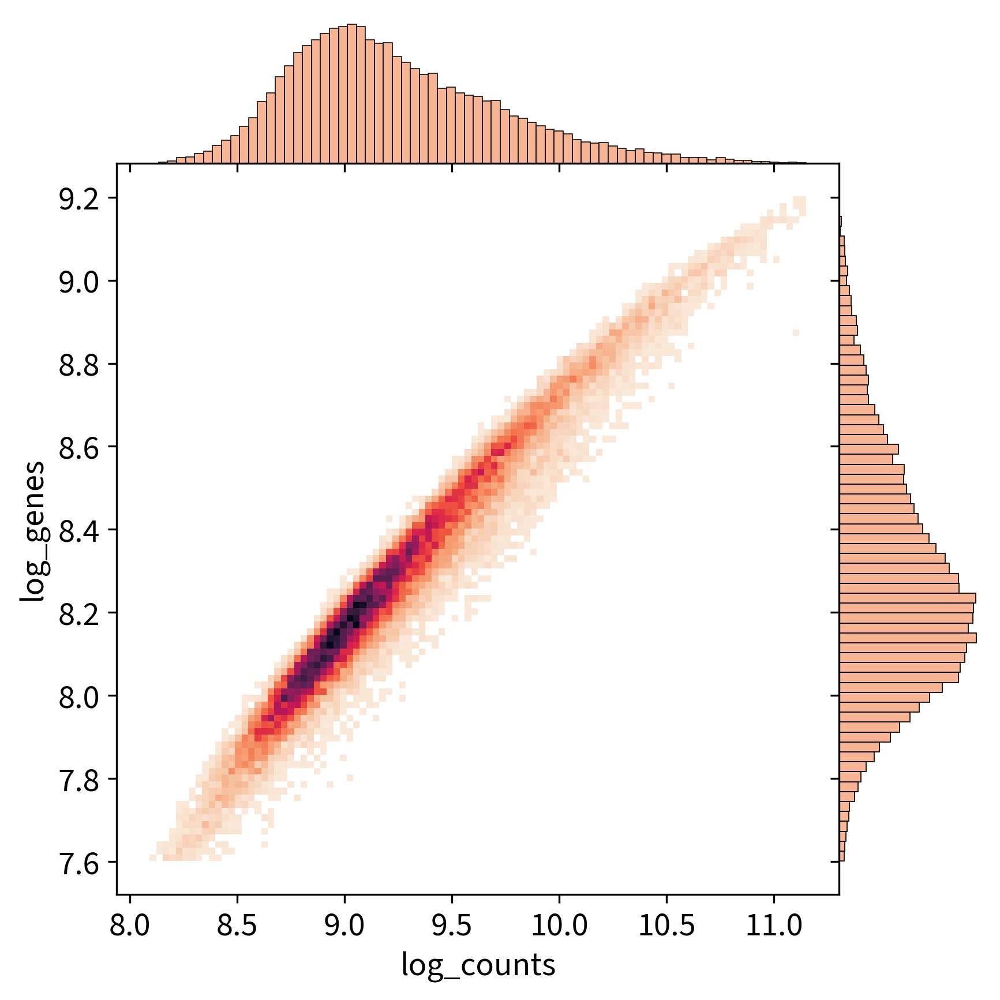

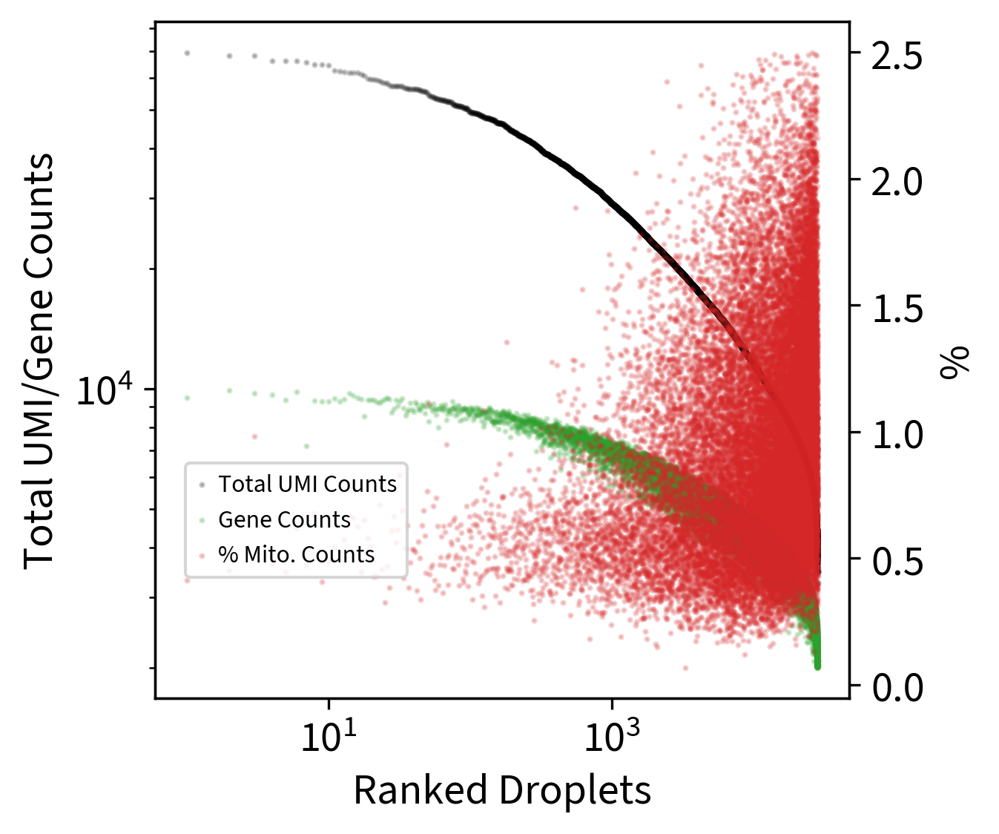

In [13]:
qc_metrics(rna, ambient=True)

In [14]:
# Load peak counts from merged peaks
counts = h5py.File('/home/michi/Projects/scMultiome_Mouse-Islets_NVF_E14-E16_Notebooks/Files/scMultiome_Mouse-Islets_NVF_E14-E16_seurat_markedDoublets_mergedPeaks_atac_count_matrix.h5', 'r')
features = pd.read_csv('/home/michi/Projects/scMultiome_Mouse-Islets_NVF_E14-E16_Notebooks/Files/scMultiome_Mouse-Islets_NVF_E14-E16_seurat_markedDoublets_mergedPeaks_atac_count_matrix_features.txt', header=None)
barcodes = pd.read_csv('/home/michi/Projects/scMultiome_Mouse-Islets_NVF_E14-E16_Notebooks/Files/scMultiome_Mouse-Islets_NVF_E14-E16_seurat_markedDoublets_mergedPeaks_atac_count_matrix_barcodes.txt', header=None)

# generate sparse count matrix for anndata
X = sparse.csr_matrix((np.array(counts['HDF5ArrayAUTO00001']['data']), np.array(counts['HDF5ArrayAUTO00001']['indices']), np.array(counts['HDF5ArrayAUTO00001']['indptr'])))

# Initiate new anndata objects
adata_peaks = ad.AnnData(X = X)

# Assign obs & var names
adata_peaks.var_names = features[0]
adata_peaks.obs_names = barcodes[0]

# Set feature type
adata_peaks.var['feature_types'] = 'Peaks'
adata_peaks.var['modality'] = 'Peaks'
adata_peaks.var['genome'] = 'mus_musculus_GRCm38_ensrel102_cr2_0_0_venus'

# Rename var_names
adata_peaks.var_names = [var_name.split('-')[0]+':'+var_name.split('-')[1]+'-'+var_name.split('-')[2] for var_name in adata_peaks.var_names]

# Make sure obs are in right order
adata_peaks = adata_peaks[rna.obs_names].copy()

In [15]:
# Make new mdata object
mdata = mu.MuData({'rna': rna, 'atac': adata_peaks})

# Set obs
mdata.obs.loc[:,['sample', 'name', 'stage', 'stage_num', 'int_id', 'seq_id_gex_id', 'seq_id_atac', 'reporter', 'experiment_batch', 'sequencing_batch', 'final_doublets', 'final_doublets_cat', 'doublet_calls', 'batch']] = mdata.mod['rna'].obs.loc[:,['sample', 'name', 'stage', 'stage_num', 'int_id', 'seq_id_gex_id', 'seq_id_atac', 'reporter', 'experiment_batch', 'sequencing_batch', 'final_doublets', 'final_doublets_cat', 'doublet_calls', 'batch']]
mdata.mod['atac'].obs.loc[:,['sample', 'name', 'stage', 'stage_num', 'int_id', 'seq_id_gex_id', 'seq_id_atac', 'reporter', 'experiment_batch', 'sequencing_batch', 'final_doublets', 'final_doublets_cat', 'doublet_calls', 'batch']] = mdata.mod['rna'].obs.loc[:,['sample', 'name', 'stage', 'stage_num', 'int_id', 'seq_id_gex_id', 'seq_id_atac', 'reporter', 'experiment_batch', 'sequencing_batch', 'final_doublets', 'final_doublets_cat', 'doublet_calls', 'batch']]

# Add file locations
mu.atac.tl.locate_fragments(mdata.mod['atac'], fragments='/storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/cr_aggr/outs/atac_fragments.tsv.gz')

# mu.atac.tl.locate_fragments add a OrderedDict containing the fragments file path, which cannot be saved. Converting to dict
mdata.mod['atac'].uns['files'] = dict(mdata.mod['atac'].uns['files'])
mdata.mod['atac'].uns = dict(mdata.mod['atac'].uns)

[W::hts_idx_load3] The index file is older than the data file: /storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/cr_aggr/outs/atac_fragments.tsv.gz.tbi


X is spare. Densifying X...


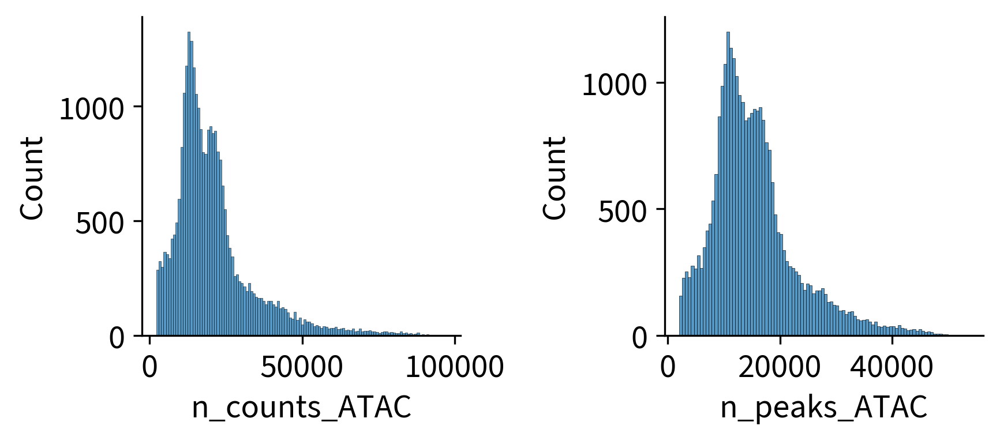

[W::hts_idx_load3] The index file is older than the data file: /storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/cr_aggr/outs/atac_fragments.tsv.gz.tbi
Reading Fragments: 100%|██████████| 1000000/1000000 [00:02<00:00, 422180.99it/s]

Added a "nucleosome_signal" column to the .obs slot of the AnnData object



[W::hts_idx_load3] The index file is older than the data file: /storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/cr_aggr/outs/atac_fragments.tsv.gz.tbi
Fetching Regions...: 100%|████████████████████████| 1/1 [00:12<00:00, 12.54s/it]


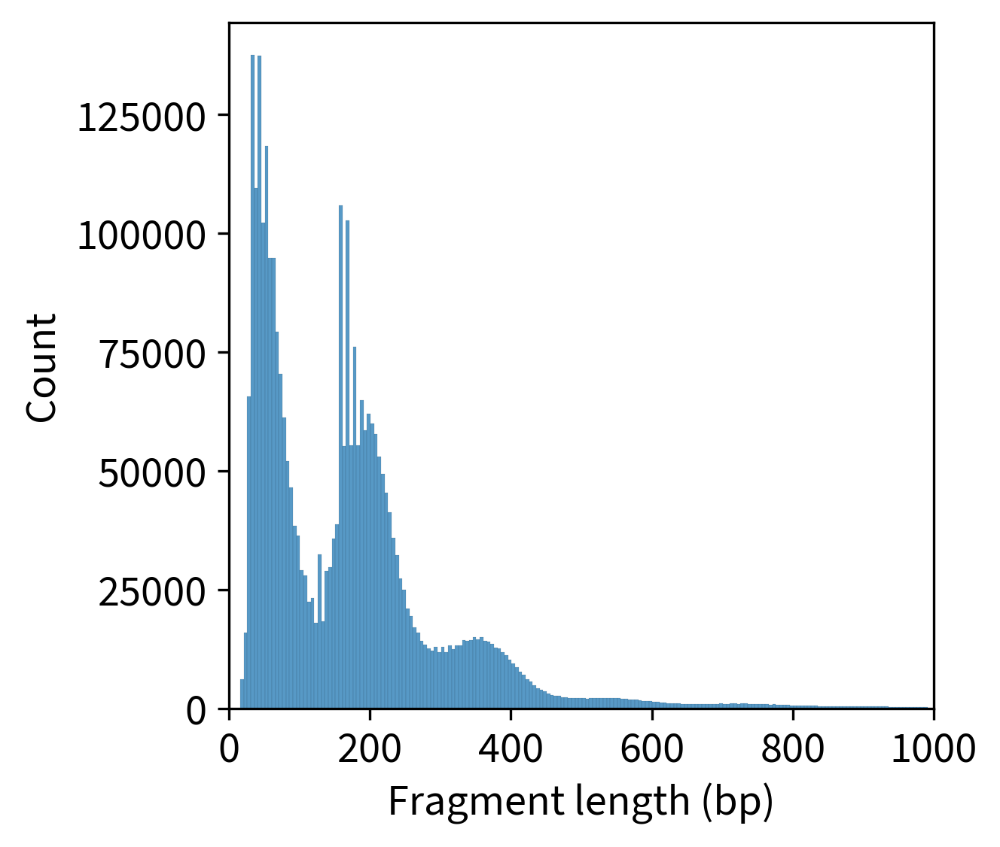

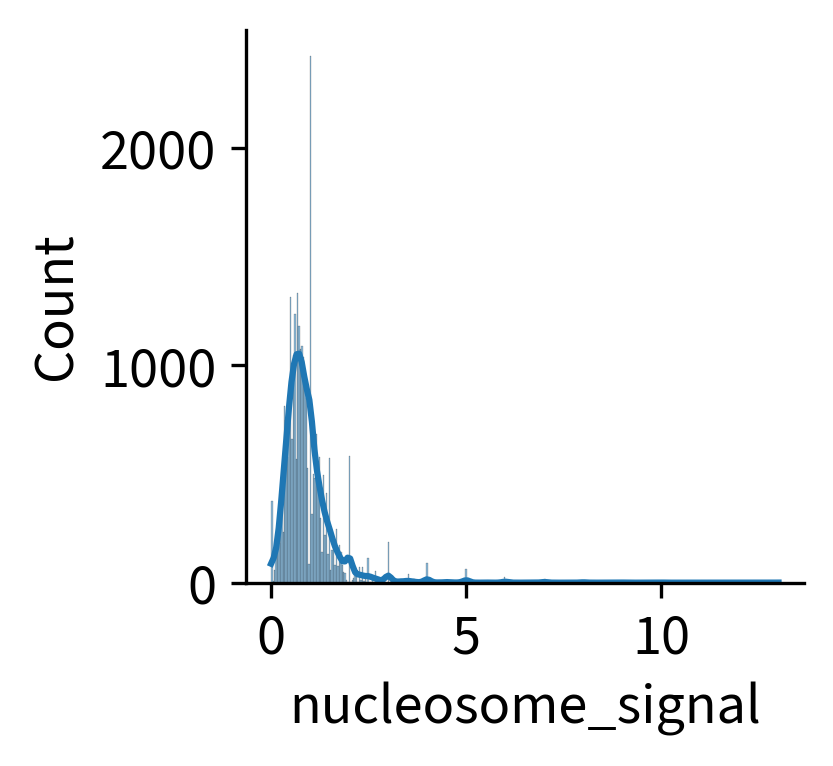

[W::hts_idx_load3] The index file is older than the data file: /storage/scRNA-seq/scMultiome_Mouse-Islets_NVF_E14-E16_P23044/cr_arc_rev9/cr_aggr/outs/atac_fragments.tsv.gz.tbi
Fetching Regions...: 100%|██████████████████| 1998/1998 [01:52<00:00, 17.73it/s]


Added a "tss_score" column to the .obs slot of tof the 'atac' modality


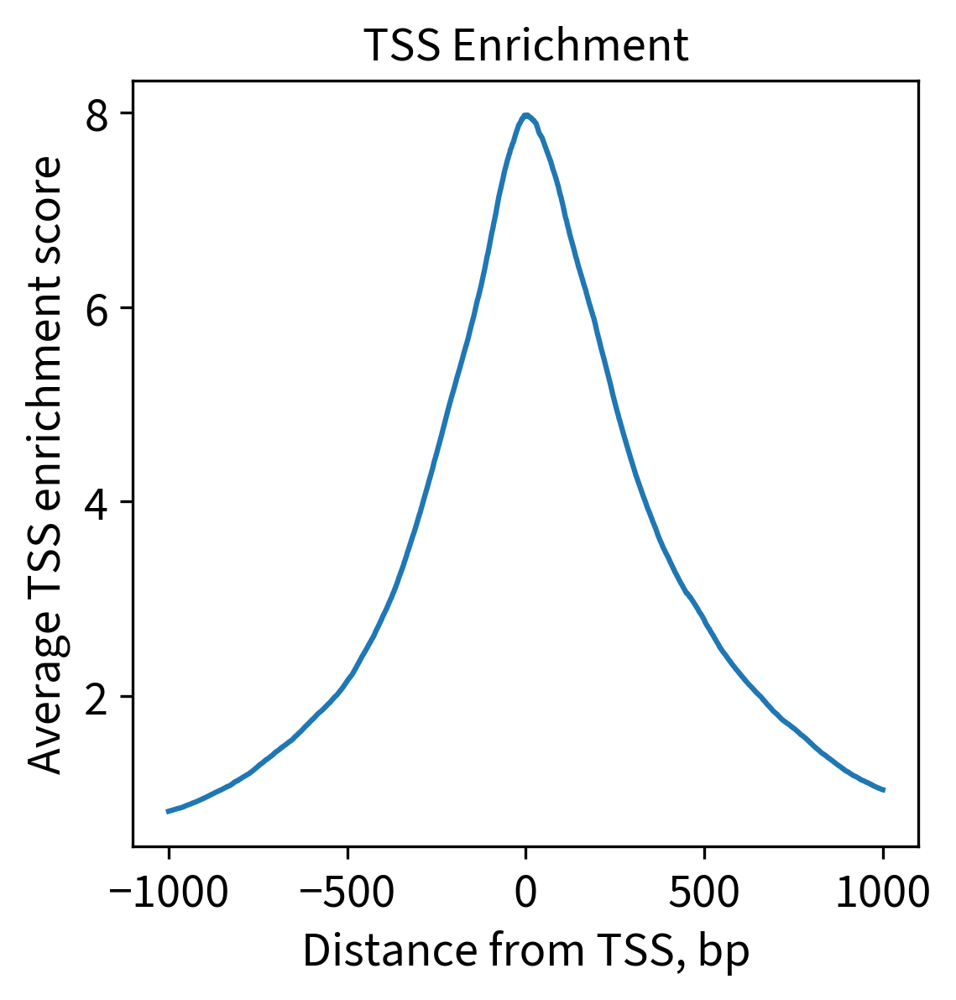

In [16]:
atac_qc_metrics(mdata.mod['atac'], mdata, n_tss=2000)#, barcodes='aggr_barcodes')

In [17]:
# get gex
adata = mdata.mod['rna']

In [18]:
get_umap_leiden(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:20)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:59)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:10)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


In [19]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 31255
filtered out 11011 genes that are detected in less than 20 cells
Number of genes after cell filter: 20244


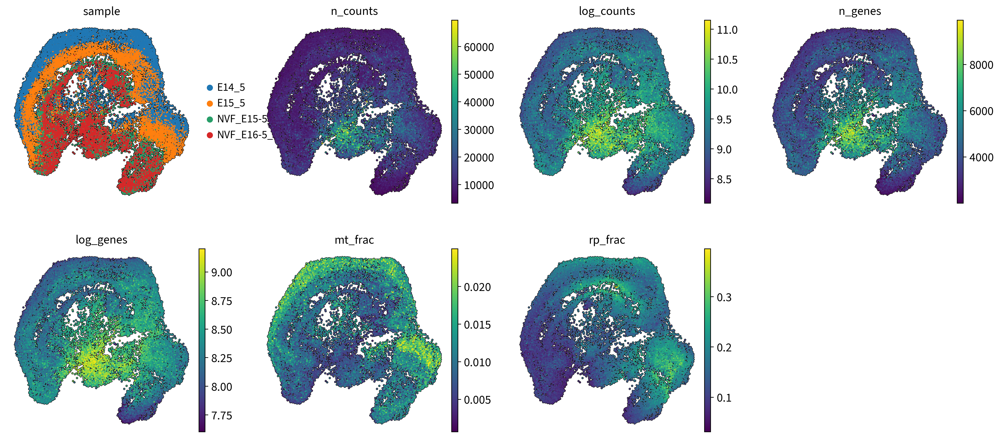

In [20]:
sc.pl.umap(adata, color=['sample','n_counts','log_counts','n_genes','log_genes','mt_frac','rp_frac'], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)

# Doublets

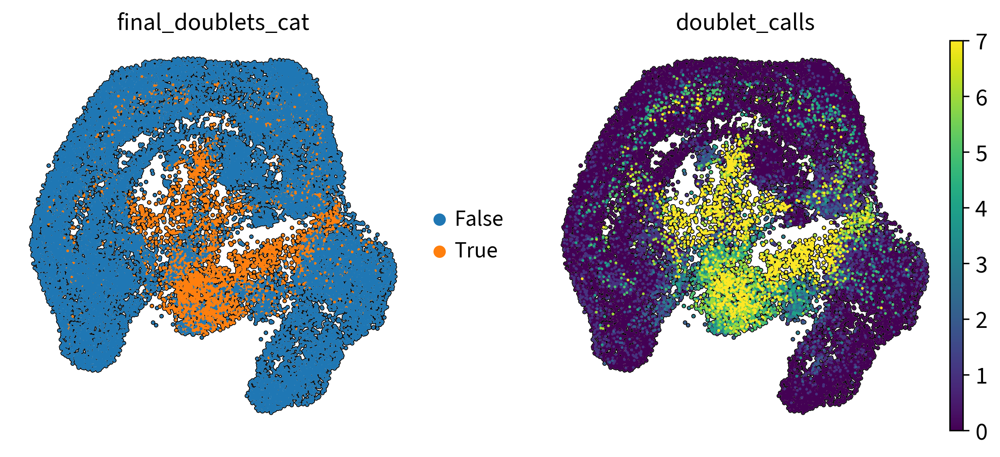

In [21]:
sc.pl.umap(adata, color=['final_doublets_cat','doublet_calls'], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=2)

In [22]:
# Number of doublet calls calls
print(adata.obs['doublet_calls'].value_counts())

0    19963
1     2980
7     1380
2     1000
6      890
5      762
3      759
4      748
Name: doublet_calls, dtype: int64


In [23]:
# Number of final doublets
print('Number of doublets:')
print(adata.obs['final_doublets'].value_counts())

# Percentage:
print('\nOverall doublet rate: ',adata.obs['final_doublets'].value_counts()[1]/len(adata.obs['final_doublets'])*100,'%')

for sample in set(adata.obs['sample']):
    print('\n',sample,'doublet rate: ',adata.obs['final_doublets'][adata.obs['sample']==sample].value_counts()[1]/len(adata.obs['final_doublets'][adata.obs['sample']==sample])*100,'%')

Number of doublets:
False    24702
True      3780
Name: final_doublets, dtype: int64

Overall doublet rate:  13.27153991994944 %

 NVF_E15-5_Rep2 doublet rate:  16.676453317674692 %

 E15_5 doublet rate:  10.726869372308496 %

 E14_5 doublet rate:  12.604176421013202 %

 NVF_E16-5_Rep1 doublet rate:  15.106340687736036 %


In [24]:
# Annotate the data sets
print(adata.obs['sample'].value_counts())

# Checking the total size of the data set
adata.shape

E14_5             10679
E15_5              7663
NVF_E15-5_Rep2     5109
NVF_E16-5_Rep1     5031
Name: sample, dtype: int64


(28482, 20244)

In [25]:
# Clean up .obs
adata.obs = adata.obs.loc[:,['sample', 'name', 'stage', 'stage_num', 'int_id', 'seq_id_gex_id', 'seq_id_atac', 'reporter', 'experiment_batch', 'sequencing_batch', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'final_doublets', 'final_doublets_cat', 'doublet_calls', 'batch']]

In [26]:
mdata

MuData object with n_obs × n_vars = 28482 × 282931
  obs:	'sample', 'name', 'stage', 'stage_num', 'int_id', 'seq_id_gex_id', 'seq_id_atac', 'reporter', 'experiment_batch', 'sequencing_batch', 'final_doublets', 'final_doublets_cat', 'doublet_calls', 'batch'
  var:	'feature_types', 'genome'
  2 modalities
    rna:	28482 x 20244
      obs:	'sample', 'name', 'stage', 'stage_num', 'int_id', 'seq_id_gex_id', 'seq_id_atac', 'reporter', 'experiment_batch', 'sequencing_batch', 'n_counts', 'log_counts', 'n_counts_rank', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'final_doublets', 'final_doublets_cat', 'doublet_calls', 'batch'
      var:	'gene_ids', 'feature_types', 'genome', 'interval', 'ambient_genes_E14_5-0', 'is_ambient_E14_5-0', 'n_counts-0', 'n_counts-1', 'ambient_genes_E15_5-1', 'is_ambient_E15_5-1', 'n_counts-2', 'ambient_genes_NVF_E15-5_Rep2-2', 'is_ambient_NVF_E15-5_Rep2-2', 'n_counts-3', 'ambient_genes_NVF_E16-5_Rep1-3', 'is_ambient_NVF_E16-5_Rep1-3', 'is_ambient', 'n_counts', 'n_cells'
      uns:	'sample_colors', 'final_doublets_cat_colors'
      obsm:	'X_umap'
      layers:	'matrix', 'ambiguous', 'spliced', 'unspliced'
    atac:	28482 x 251676
      obs:	'sample', 'name', 'stage', 'stage_num', 'int_id', 'seq_id_gex_id', 'seq_id_atac', 'reporter', 'experiment_batch', 'sequencing_batch', 'final_doublets', 'final_doublets_cat', 'doublet_calls', 'batch', 'n_counts_ATAC', 'log_counts_ATAC', 'n_counts_rank_ATAC', 'n_peaks_ATAC', 'log_peaks_ATAC', 'nucleosome_signal', 'tss_score'
      var:	'feature_types', 'modality', 'genome', 'n_counts'
      uns:	'files'

## Save

In [27]:
sparsify_all_layers_mdata(mdata)

Sparsify .X in modality rna
Layer matrix  in modality rna already spase...
Layer ambiguous  in modality rna already spase...
Layer spliced  in modality rna already spase...
Layer unspliced  in modality rna already spase...
Sparsify .X in modality atac


In [28]:
# Save
mdata.write('/home/michi/Projects/scMultiome_Mouse-Islets_NVF_E14-E16_Notebooks/Files/scMultiome_Mouse-Islets_NVF_E14-E16_mdata_markedDoublets_mergedPeaks.h5mu')